# Trabajo final

## Presentan:

* Larisa López
* Leonardo Pantoja
* Daniel Isita

Este archivo contiene el código relacionado al uso de mapas y librerías espaciales (tales como `GeoPandas` y/o  `Folium`) con la finalidad de profundizar el análisis geoespacial del trabajo final.

## 1) Cargamos archivos

Primero el de `Datos_Estados`

In [14]:
# Cargamos librerías
import pandas as pd

# Ruta del archivo CSV
file_path = '3. Data/Datos_Estados.csv'

# Leemos el archivo
df_estados = pd.read_csv(file_path)

# Le agregamos un 0 cuando la variable estado es de un dígito y lo 
# convertimos a string
df_estados['id_ent'] = df_estados['estado'].apply(lambda x: f'{x:02d}').astype(str)
df_estados.head()

,estado,part_polit_gob,def_x_est,def_x_est_muj,def_x_est_hom,nacim_x_est,nacim_x_est_a,nacim_x_est_o,porc_nac_x_est,cant_nac_x_est,...,prom_habit_viv,prom_ingr_trim,gast_alim_esta_trim,gast_vest_esta_trim,gast_viv_serv_trim,gast_mueb_limp_trim,gast_salud_trim,gast_tras_trim,gast_educ_trim,id_ent
0,1,3,174,143,31,23067,11801,11266,16.0,3691,...,3.7,58303,12303,1327,3159,2261,1647,7661,3299,01
1,2,2,121,104,17,59015,29651,29364,13.3,7849,...,3.3,67821,11954,991,5704,2426,1172,8315,2412,02
2,3,2,58,53,5,10242,5158,5084,13.2,1352,...,3.3,64266,12812,942,4330,2526,1149,7308,2237,03
3,4,2,110,91,19,14295,7246,7049,13.6,1944,...,3.6,47276,10846,659,2276,2019,1288,5400,2274,04
4,5,2,245,192,53,146298,74434,71864,17.4,25456,...,4.1,29168,8069,668,1541,1541,988,3015,1260,05


Seguimos con el de _Localidades_: `Datos_Localidad`

In [19]:
# Ruta del archivo CSV
file_path = '3. Data/Datos_Localidad.csv'

# Leemos el archivo
df_localidad = pd.read_csv(file_path)
# Creamos la variable de fecha
df_localidad['fecha'] = pd.to_datetime(df_localidad['mes'], format='%d/%m/%Y')
#df_localidad.head()

Luego el de _Gastos_: `Datos_Gastos_Tiendas`

In [3]:
# Ruta del archivo CSV
file_path = '3. Data/Datos_Gastos_Tiendas.csv'

# Leemos el archivo
df_gastos = pd.read_csv(file_path)

# Eliminamos NA en lat y lon
df_gastos = df_gastos.dropna(subset=['latitud', 'longitud'])
df_gastos.head()

,Estado / Canal,Ciudad,latitud,longitud,Tienda,dic-22,nov-22,oct-22,sep-22,ago-22,jul-22,jun-22,may-22,abr-22,mar-22,feb-22,ene-22
0,CHIHUAHUA,CD JUAREZ,31.739081,-106.629825,15,6289.91,6286.86,6286.86,6286.86,6291.43,5814.17,6286.86,15430.80969,15525.4073,14284.9273,14283.4073,16847.99927
1,SINALOA,CULIACAN,24.808418,-107.400321,16,9449.10,9467.88,9449.10,9449.10,9449.10,8976.41,9449.10,10268.10000,9392.3500,7490.1000,7490.1000,8688.51600
2,SINALOA,CULIACAN,24.806212,-107.398218,17,6949.82,6949.82,6949.82,6169.82,6169.82,6477.13,6949.82,7049.15000,5999.0900,5286.9700,5284.7500,6132.07320
3,SINALOA,CULIACAN,24.800166,-107.398998,18,11668.38,11666.86,11668.38,11152.96,8425.26,11194.17,11668.38,5807.51000,5026.1000,4549.9100,4551.4300,5621.33680
4,SINALOA,CULIACAN,24.794238,-107.415834,19,12410.86,12410.86,11819.56,7960.86,7960.86,11938.17,11819.56,10254.06000,10515.4600,10150.8600,10150.8600,11774.99760


In [4]:
# Creamos un DF en formato long
df_gastos_long =pd.melt(df_gastos, id_vars=['Estado / Canal', 'Ciudad', 'latitud', 'longitud', 'Tienda'],
                        var_name='Fecha', value_name='Gastos')

# Separamos la variable de fecha
df_gastos_long['Fecha'] = df_gastos_long['Fecha'].apply(lambda x: x.split('-')[0] + '-01-' + x.split('-')[1])

# Mapeo de nombres de meses a números de meses
meses = {'ene': 1, 'feb': 2, 'mar': 3, 'abr': 4, 'may': 5, 'jun': 6, 'jul': 7, 'ago': 8, 'sep': 9, 'oct': 10, 'nov': 11, 'dic': 12}

# Aplicar el mapeo y construir la columna 'Fecha' directamente
df_gastos_long['Fecha'] = df_gastos_long['Fecha'].apply(lambda x: f"{meses[x.split('-')[0].lower()]:02d}-01-20{x.split('-')[1]}")

# Convertir la columna 'Fecha' a formato de fecha
df_gastos_long['Fecha'] = pd.to_datetime(df_gastos_long['Fecha'], format='%m-%d-%Y', errors='coerce')

df_gastos_long.head()

,Estado / Canal,Ciudad,latitud,longitud,Tienda,Fecha,Gastos
0,CHIHUAHUA,CD JUAREZ,31.739081,-106.629825,15,2001-12-01,6289.91
1,SINALOA,CULIACAN,24.808418,-107.400321,16,2001-12-01,9449.10
2,SINALOA,CULIACAN,24.806212,-107.398218,17,2001-12-01,6949.82
3,SINALOA,CULIACAN,24.800166,-107.398998,18,2001-12-01,11668.38
4,SINALOA,CULIACAN,24.794238,-107.415834,19,2001-12-01,12410.86


Y por último el de _Ventas_: `Datos_Ventas_Tiendas`

In [5]:
# Ruta del archivo CSV
file_path = '3. Data/Datos_Ventas_Tiendas.csv'

# Leemos el archivo
df_ventas = pd.read_csv(file_path)
df_ventas.head()

,Estado / Canal,Ciudad,coordenadas,Tienda,dic-22,nov-22,oct-22,sep-22,ago-22,jul-22,jun-22,may-22,abr-22,mar-22,feb-22,ene-22
0,CHIHUAHUA,CD JUAREZ,"31.7390805,-106.6298246,12",15,50612000,33852000,27367000,24830000,26913000,29797000,27891000,28283000,26712000,24351000,21560000,18578000
1,SINALOA,CULIACAN,"24.8084179,-107.4003212,17.5",16,54774000,31854000,25127000,23145000,25571000,24785000,23280000,27140000,24207000,22068000,18115000,16860000
2,SINALOA,CULIACAN,"24.8062124,-107.3982179,18.25",17,30009000,13998000,10266000,9812000,11010000,10524000,10918000,13824000,15537000,14139000,13066000,10828000
3,SINALOA,CULIACAN,"24.8001665,-107.3989983,16.25",18,9870000,5972000,4686000,4414000,4645000,4284000,4335000,5155000,4265000,4805000,4070000,3540000
4,SINALOA,CULIACAN,"24.7942375,-107.4158336,17.25",19,41301000,25055000,18477000,17959000,19315000,19977000,18835000,22606000,20126000,18598000,15395000,14475000


In [6]:
# Creamos un DF en formato long
df_ventas_long =pd.melt(df_ventas, id_vars=['Estado / Canal', 'Ciudad', 'coordenadas', 'Tienda'],
                        var_name='Fecha', value_name='Ventas')

# Separamos la variable de fecha
df_ventas_long['Fecha'] = df_ventas_long['Fecha'].apply(lambda x: x.split('-')[0] + '-01-' + x.split('-')[1])

# Aplicar el mapeo y construir la columna 'Fecha' directamente
df_ventas_long['Fecha'] = df_ventas_long['Fecha'].apply(lambda x: f"{meses[x.split('-')[0].lower()]:02d}-01-20{x.split('-')[1]}")

# Convertir la columna 'Fecha' a formato de fecha
df_ventas_long['Fecha'] = pd.to_datetime(df_ventas_long['Fecha'], format='%m-%d-%Y', errors='coerce')

df_ventas_long.head()

,Estado / Canal,Ciudad,coordenadas,Tienda,Fecha,Ventas
0,CHIHUAHUA,CD JUAREZ,"31.7390805,-106.6298246,12",15,2001-12-01,50612000
1,SINALOA,CULIACAN,"24.8084179,-107.4003212,17.5",16,2001-12-01,54774000
2,SINALOA,CULIACAN,"24.8062124,-107.3982179,18.25",17,2001-12-01,30009000
3,SINALOA,CULIACAN,"24.8001665,-107.3989983,16.25",18,2001-12-01,9870000
4,SINALOA,CULIACAN,"24.7942375,-107.4158336,17.25",19,2001-12-01,41301000


## 2) Convertimos los `df` a objetos espaciales

Para ello, primero descargaremos los archivos del INEGI, en formato `.shp` (_shape file_) para después integrarlo con las bases de datos.

Se puede consultar los archivos del INEGI directo en su página de _Marco Geoestadístico Nacional_.

https://www.inegi.org.mx/temas/mg/

In [8]:
#!pip install geopandas

In [10]:
# Importamos librería
import geopandas as gpd

# Ruta del archivo Shapefile (.shp)
shapefile_path = '3. Data/nacional_dic22/mg2022_integrado/conjunto_de_datos/00ent.shp'

# Cargar el Shapefile en un GeoDataFrame
gdf_mex_ent = gpd.read_file(shapefile_path)
gdf_mex_ent.head()

,CVEGEO,CVE_ENT,NOMGEO,geometry
0,01,01,Aguascalientes,"POLYGON ((2470517.824 1155028.588, 2470552.248..."
1,02,02,Baja California,"MULTIPOLYGON (((1313480.513 1831458.607, 13135..."
2,03,03,Baja California Sur,"MULTIPOLYGON (((1694656.344 1227647.637, 16946..."
3,04,04,Campeche,"MULTIPOLYGON (((3544897.199 946994.621, 354491..."
4,05,05,Coahuila de Zaragoza,"POLYGON ((2469954.193 1978522.993, 2469982.807..."


Comenzamos con el archivo de **Estados**

In [20]:
# Agregamos la geometria 
x = pd.merge(df_estados, gdf_mex_ent[['CVEGEO', 'geometry']], left_on='id_ent', right_on='CVEGEO', how='left')

# Puedes eliminar la columna 'CVEGEO' duplicada si lo deseas
x.drop('CVEGEO', axis=1, inplace=True)

# Convierte el DataFrame resultante a un GeoDataFrame
gdf_estados = gpd.GeoDataFrame(x, geometry='geometry')

# Muestra las primeras filas del GeoDataFrame resultante
gdf_estados.head(3)

,estado,part_polit_gob,def_x_est,def_x_est_muj,def_x_est_hom,nacim_x_est,nacim_x_est_a,nacim_x_est_o,porc_nac_x_est,cant_nac_x_est,...,prom_ingr_trim,gast_alim_esta_trim,gast_vest_esta_trim,gast_viv_serv_trim,gast_mueb_limp_trim,gast_salud_trim,gast_tras_trim,gast_educ_trim,id_ent,geometry
0,1,3,174,143,31,23067,11801,11266,16.0,3691,...,58303,12303,1327,3159,2261,1647,7661,3299,01,"POLYGON ((2470517.824 1155028.588, 2470552.248..."
1,2,2,121,104,17,59015,29651,29364,13.3,7849,...,67821,11954,991,5704,2426,1172,8315,2412,02,"MULTIPOLYGON (((1313480.513 1831458.607, 13135..."
2,3,2,58,53,5,10242,5158,5084,13.2,1352,...,64266,12812,942,4330,2526,1149,7308,2237,03,"MULTIPOLYGON (((1694656.344 1227647.637, 16946..."


### Y ahora para el de **Gastos** y **Ventas**

Comenzaremos con el de gastos

In [22]:
# Sacamos la geometría de las columnas de longitud y latitud
geometry = gpd.points_from_xy(df_gastos['longitud'], df_gastos['latitud'])

# Creamos el nuevo geodataframe
gdf_gastos = gpd.GeoDataFrame(df_gastos, geometry=geometry)
gdf_gastos.head()

,Estado / Canal,Ciudad,latitud,longitud,Tienda,dic-22,nov-22,oct-22,sep-22,ago-22,jul-22,jun-22,may-22,abr-22,mar-22,feb-22,ene-22,geometry
0,CHIHUAHUA,CD JUAREZ,31.739081,-106.629825,15,6289.91,6286.86,6286.86,6286.86,6291.43,5814.17,6286.86,15430.80969,15525.4073,14284.9273,14283.4073,16847.99927,POINT (-106.62982 31.73908)
1,SINALOA,CULIACAN,24.808418,-107.400321,16,9449.10,9467.88,9449.10,9449.10,9449.10,8976.41,9449.10,10268.10000,9392.3500,7490.1000,7490.1000,8688.51600,POINT (-107.40032 24.80842)
2,SINALOA,CULIACAN,24.806212,-107.398218,17,6949.82,6949.82,6949.82,6169.82,6169.82,6477.13,6949.82,7049.15000,5999.0900,5286.9700,5284.7500,6132.07320,POINT (-107.39822 24.80621)
3,SINALOA,CULIACAN,24.800166,-107.398998,18,11668.38,11666.86,11668.38,11152.96,8425.26,11194.17,11668.38,5807.51000,5026.1000,4549.9100,4551.4300,5621.33680,POINT (-107.39900 24.80017)
4,SINALOA,CULIACAN,24.794238,-107.415834,19,12410.86,12410.86,11819.56,7960.86,7960.86,11938.17,11819.56,10254.06000,10515.4600,10150.8600,10150.8600,11774.99760,POINT (-107.41583 24.79424)


### Luego el de gastos long

In [23]:
# Hacemos lo mismo para el archivo long
geometry = gpd.points_from_xy(df_gastos_long['longitud'], df_gastos_long['latitud'])

# Creamos el nuevo geodataframe
gdf_gastos_l = gpd.GeoDataFrame(df_gastos_long, geometry=geometry)
gdf_gastos_l.head()

,Estado / Canal,Ciudad,latitud,longitud,Tienda,Fecha,Gastos,geometry
0,CHIHUAHUA,CD JUAREZ,31.739081,-106.629825,15,2001-12-01,6289.91,POINT (-106.62982 31.73908)
1,SINALOA,CULIACAN,24.808418,-107.400321,16,2001-12-01,9449.10,POINT (-107.40032 24.80842)
2,SINALOA,CULIACAN,24.806212,-107.398218,17,2001-12-01,6949.82,POINT (-107.39822 24.80621)
3,SINALOA,CULIACAN,24.800166,-107.398998,18,2001-12-01,11668.38,POINT (-107.39900 24.80017)
4,SINALOA,CULIACAN,24.794238,-107.415834,19,2001-12-01,12410.86,POINT (-107.41583 24.79424)


### Ahora el de ventas

In [50]:
from shapely.geometry import Point

# Usamos str.replace
df_ventas['coordenadas'] = df_ventas['coordenadas'].str.replace(',', ', ')

# Dividimos la columna 'coordenadas' en latitud, longitud y altitud
df_ventas[['latitud', 'longitud_altitud']] = df_ventas['coordenadas'].str.split(',', 1, expand=True)

# Ahora, dividir la columna 'longitud_altitud' en longitud y altitud
df_ventas[['longitud', 'altitud']] = df_ventas['longitud_altitud'].str.split('.', 1, expand=True)

# Eliminamos los espacios en blanco alrededor de cada valor y convertir a tipo float
df_ventas[['latitud', 'longitud', 'altitud']] = df_ventas[['latitud', 'longitud', 'altitud']].apply(lambda x: x.str.strip())

# Eliminamos los espacios en blanco y convertir a tipo float
df_ventas['altitud'] = pd.to_numeric(df_ventas['altitud'].str.replace(' ', ''), errors='coerce')

# Convertimos a tipo float
df_ventas[['latitud', 'longitud', 'altitud']] = df_ventas[['latitud', 'longitud', 'altitud']].astype(float)

# Creamos objetos Point a partir de las columnas de latitud y longitud
geometry = [Point(xy) for xy in zip(df_ventas['longitud'], df_ventas['latitud'])]

# Creamos el GeoDataFrame a partir del DataFrame y la geometría
gdf_ventas = gpd.GeoDataFrame(df_ventas, geometry=geometry)

gdf_ventas.head()

C:\Users\Daniel.Isita\AppData\Local\Temp\ipykernel_24548\409919119.py:7: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  df_ventas[['latitud', 'longitud_altitud']] = df_ventas['coordenadas'].str.split(',', 1, expand=True)
C:\Users\Daniel.Isita\AppData\Local\Temp\ipykernel_24548\409919119.py:10: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  df_ventas[['longitud', 'altitud']] = df_ventas['longitud_altitud'].str.split('.', 1, expand=True)


,Estado / Canal,Ciudad,coordenadas,Tienda,dic-22,nov-22,oct-22,sep-22,ago-22,jul-22,...,may-22,abr-22,mar-22,feb-22,ene-22,latitud,longitud,altitud,longitud_altitud,geometry
0,CHIHUAHUA,CD JUAREZ,"31.7390805, -106.6298246, ...",15,50612000,33852000,27367000,24830000,26913000,29797000,...,28283000,26712000,24351000,21560000,18578000,31.739081,-106.0,NaN,"-106.6298246, 12",POINT (-106.00000 31.73908)
1,SINALOA,CULIACAN,"24.8084179, -107.4003212, ...",16,54774000,31854000,25127000,23145000,25571000,24785000,...,27140000,24207000,22068000,18115000,16860000,24.808418,-107.0,NaN,"-107.4003212, 17.5",POINT (-107.00000 24.80842)
2,SINALOA,CULIACAN,"24.8062124, -107.3982179, ...",17,30009000,13998000,10266000,9812000,11010000,10524000,...,13824000,15537000,14139000,13066000,10828000,24.806212,-107.0,NaN,"-107.3982179, 18.25",POINT (-107.00000 24.80621)
3,SINALOA,CULIACAN,"24.8001665, -107.3989983, ...",18,9870000,5972000,4686000,4414000,4645000,4284000,...,5155000,4265000,4805000,4070000,3540000,24.800166,-107.0,NaN,"-107.3989983, 16.25",POINT (-107.00000 24.80017)
4,SINALOA,CULIACAN,"24.7942375, -107.4158336, ...",19,41301000,25055000,18477000,17959000,19315000,19977000,...,22606000,20126000,18598000,15395000,14475000,24.794238,-107.0,NaN,"-107.4158336, 17.25",POINT (-107.00000 24.79424)


### Por último, el de ventas long

In [51]:
# Usamos str.replace
df_ventas_long['coordenadas'] = df_ventas_long['coordenadas'].str.replace(',', ', ')

# Dividimos la columna 'coordenadas' en latitud, longitud y altitud
df_ventas_long[['latitud', 'longitud_altitud']] = df_ventas_long['coordenadas'].str.split(',', 1, expand=True)

# Ahora, dividir la columna 'longitud_altitud' en longitud y altitud
df_ventas_long[['longitud', 'altitud']] = df_ventas_long['longitud_altitud'].str.split('.', 1, expand=True)

# Eliminamos los espacios en blanco alrededor de cada valor y convertir a tipo float
df_ventas_long[['latitud', 'longitud', 'altitud']] = df_ventas_long[['latitud', 'longitud', 'altitud']].apply(lambda x: x.str.strip())

# Eliminamos los espacios en blanco y convertir a tipo float
df_ventas_long['altitud'] = pd.to_numeric(df_ventas_long['altitud'].str.replace(' ', ''), errors='coerce')

# Convertimos a tipo float
df_ventas_long[['latitud', 'longitud', 'altitud']] = df_ventas_long[['latitud', 'longitud', 'altitud']].astype(float)

# Creamos objetos Point a partir de las columnas de latitud y longitud
geometry = [Point(xy) for xy in zip(df_ventas_long['longitud'], df_ventas_long['latitud'])]

# Creamos el GeoDataFrame a partir del DataFrame y la geometría
gdf_ventas_l = gpd.GeoDataFrame(df_ventas_long, geometry=geometry)

gdf_ventas_l.head()

C:\Users\Daniel.Isita\AppData\Local\Temp\ipykernel_24548\2159307516.py:5: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  df_ventas_long[['latitud', 'longitud_altitud']] = df_ventas_long['coordenadas'].str.split(',', 1, expand=True)
C:\Users\Daniel.Isita\AppData\Local\Temp\ipykernel_24548\2159307516.py:8: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  df_ventas_long[['longitud', 'altitud']] = df_ventas_long['longitud_altitud'].str.split('.', 1, expand=True)


,Estado / Canal,Ciudad,coordenadas,Tienda,Fecha,Ventas,latitud,longitud_altitud,longitud,altitud,geometry
0,CHIHUAHUA,CD JUAREZ,"31.7390805, -106.6298246, 12",15,2001-12-01,50612000,31.739081,"-106.6298246, 12",-106.0,NaN,POINT (-106.00000 31.73908)
1,SINALOA,CULIACAN,"24.8084179, -107.4003212, 17.5",16,2001-12-01,54774000,24.808418,"-107.4003212, 17.5",-107.0,NaN,POINT (-107.00000 24.80842)
2,SINALOA,CULIACAN,"24.8062124, -107.3982179, 18.25",17,2001-12-01,30009000,24.806212,"-107.3982179, 18.25",-107.0,NaN,POINT (-107.00000 24.80621)
3,SINALOA,CULIACAN,"24.8001665, -107.3989983, 16.25",18,2001-12-01,9870000,24.800166,"-107.3989983, 16.25",-107.0,NaN,POINT (-107.00000 24.80017)
4,SINALOA,CULIACAN,"24.7942375, -107.4158336, 17.25",19,2001-12-01,41301000,24.794238,"-107.4158336, 17.25",-107.0,NaN,POINT (-107.00000 24.79424)


## 3) Mapas

Ya tenemos nuestras cinco bases de datos en `Geopandas`:

* `gdf_estados`
* `gdf_gastos`
* `gdf_gastos_l`
* `gdf_ventas`
* `gdf_ventas_l`

Vamos a explorar visualizaciones con ellas.

Comenzaremos con `gdf_estados`

### 3.1) Base de estados

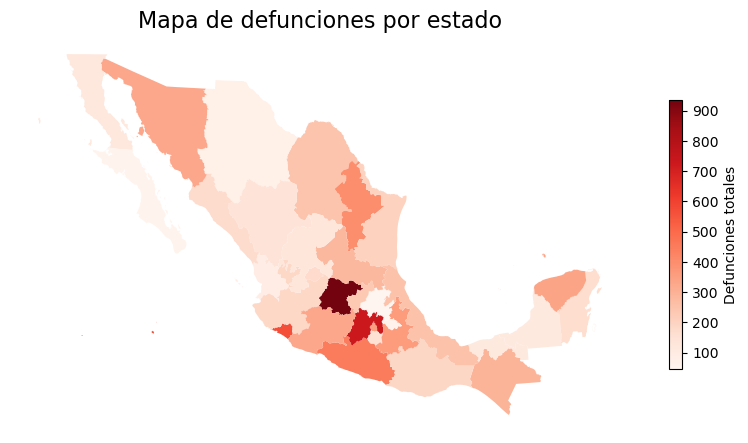

In [223]:
# Definimos la paleta de colores
num_colors = 250
custom_colors = plt.cm.Reds(range(num_colors))

# Creamos el mapa de colores personalizado
custom_cmap = ListedColormap(custom_colors)

# Configuración del gráfico
fig, ax = plt.subplots(figsize=(10, 10))  

# Para hacer el mapa
plot = gdf_estados.plot(
    column='def_x_est',
    cmap=custom_cmap,
    legend=True,
    legend_kwds={'label': "Defunciones totales", 'shrink': 0.35},  
    ax=ax  
)

# Quitamos los ejes
ax.set_axis_off()

# Agrega etiquetas de valores en cada polígono
#for x, y, label in zip(gdf_estados.geometry.centroid.x, gdf_estados.geometry.centroid.y, gdf_estados['def_x_est']):
#    ax.annotate(text=label, xy=(x, y), xytext=(3, 3), textcoords='offset points', fontsize=8, color='black')

# Título
plt.title('Mapa de defunciones por estado', fontsize=16)

# Guardamos el mapa como PNG
plt.savefig('mapa_defunciones.png', bbox_inches='tight')

# Vemos el mapa
plt.show()

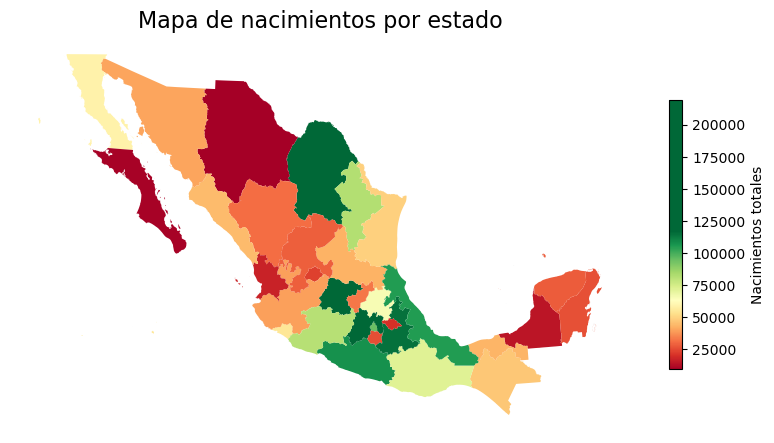

In [224]:
# Definimos la paleta de colores
num_colors = 500
custom_colors = plt.cm.RdYlGn(range(num_colors))

# Creamos el mapa de colores personalizado
custom_cmap = ListedColormap(custom_colors)

# Configuración del gráfico
fig, ax = plt.subplots(figsize=(10, 10))  


# Para hacer el mapa
plot = gdf_estados.plot(
    column='nacim_x_est',
    cmap=custom_cmap,
    legend=True,
    legend_kwds={'label': "Nacimientos totales", 'shrink': 0.35},  
    ax=ax  
)

# Quitamos los ejes
ax.set_axis_off()

# Agrega etiquetas de valores en cada polígono
#for x, y, label in zip(gdf_estados.geometry.centroid.x, gdf_estados.geometry.centroid.y, gdf_estados['def_x_est']):
#    ax.annotate(text=label, xy=(x, y), xytext=(3, 3), textcoords='offset points', fontsize=8, color='black')

# Título
plt.title('Mapa de nacimientos por estado', fontsize=16)

# Guardamos el mapa como PNG
plt.savefig('mapa_nacimientos.png', bbox_inches='tight')

# Vemos el mapa
plt.show()

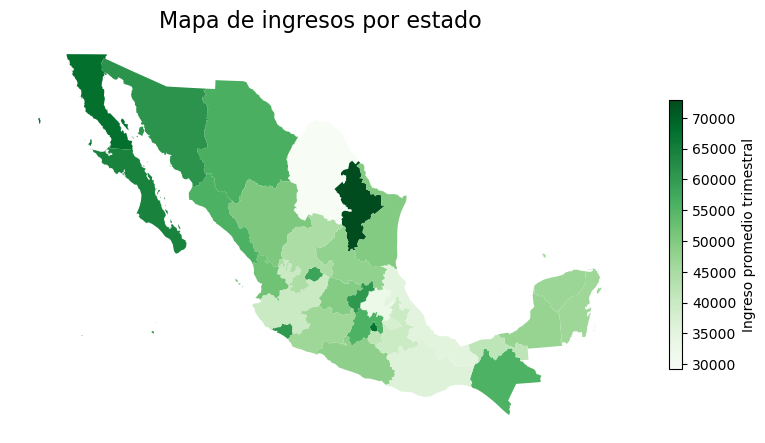

In [225]:
# Definimos la paleta de colores
num_colors = 250
custom_colors = plt.cm.Greens(range(num_colors))

# Creamos el mapa de colores personalizado
custom_cmap = ListedColormap(custom_colors)

# Configuración del gráfico
fig, ax = plt.subplots(figsize=(10, 10))  


# Para hacer el mapa
plot = gdf_estados.plot(
    column='prom_ingr_trim',
    cmap=custom_cmap,
    legend=True,
    legend_kwds={'label': "Ingreso promedio trimestral", 'shrink': 0.35},  
    ax=ax  
)

# Quitamos los ejes
ax.set_axis_off()

# Agrega etiquetas de valores en cada polígono
#for x, y, label in zip(gdf_estados.geometry.centroid.x, gdf_estados.geometry.centroid.y, gdf_estados['def_x_est']):
#    ax.annotate(text=label, xy=(x, y), xytext=(3, 3), textcoords='offset points', fontsize=8, color='black')

# Título
plt.title('Mapa de ingresos por estado', fontsize=16)

# Guardamos el mapa como PNG
plt.savefig('mapa_ingresos.png', bbox_inches='tight')

# Vemos el mapa
plt.show()

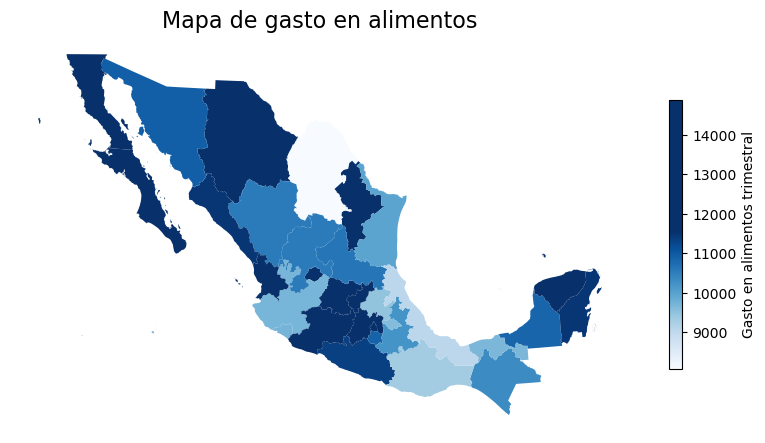

In [226]:
# Definimos la paleta de colores
num_colors = 500
custom_colors = plt.cm.Blues(range(num_colors))

# Creamos el mapa de colores personalizado
custom_cmap = ListedColormap(custom_colors)

# Configuración del gráfico
fig, ax = plt.subplots(figsize=(10, 10))  


# Para hacer el mapa
plot = gdf_estados.plot(
    column='gast_alim_esta_trim',
    cmap=custom_cmap,
    legend=True,
    legend_kwds={'label': "Gasto en alimentos trimestral", 'shrink': 0.35},  
    ax=ax  
)

# Quitamos los ejes
ax.set_axis_off()

# Agrega etiquetas de valores en cada polígono
#for x, y, label in zip(gdf_estados.geometry.centroid.x, gdf_estados.geometry.centroid.y, gdf_estados['def_x_est']):
#    ax.annotate(text=label, xy=(x, y), xytext=(3, 3), textcoords='offset points', fontsize=8, color='black')

# Título
plt.title('Mapa de gasto en alimentos', fontsize=16)

# Guardamos el mapa como PNG
plt.savefig('mapa_gasto_alimentos.png', bbox_inches='tight')

# Vemos el mapa
plt.show()

### Mapa de gastos

In [124]:
gdf_gastos.head()

,Estado / Canal,Ciudad,latitud,longitud,Tienda,dic-22,nov-22,oct-22,sep-22,ago-22,jul-22,jun-22,may-22,abr-22,mar-22,feb-22,ene-22,geometry
0,CHIHUAHUA,CD JUAREZ,31.739081,-106.629825,15,6289.91,6286.86,6286.86,6286.86,6291.43,5814.17,6286.86,15430.80969,15525.4073,14284.9273,14283.4073,16847.99927,POINT (-106.62982 31.73908)
1,SINALOA,CULIACAN,24.808418,-107.400321,16,9449.10,9467.88,9449.10,9449.10,9449.10,8976.41,9449.10,10268.10000,9392.3500,7490.1000,7490.1000,8688.51600,POINT (-107.40032 24.80842)
2,SINALOA,CULIACAN,24.806212,-107.398218,17,6949.82,6949.82,6949.82,6169.82,6169.82,6477.13,6949.82,7049.15000,5999.0900,5286.9700,5284.7500,6132.07320,POINT (-107.39822 24.80621)
3,SINALOA,CULIACAN,24.800166,-107.398998,18,11668.38,11666.86,11668.38,11152.96,8425.26,11194.17,11668.38,5807.51000,5026.1000,4549.9100,4551.4300,5621.33680,POINT (-107.39900 24.80017)
4,SINALOA,CULIACAN,24.794238,-107.415834,19,12410.86,12410.86,11819.56,7960.86,7960.86,11938.17,11819.56,10254.06000,10515.4600,10150.8600,10150.8600,11774.99760,POINT (-107.41583 24.79424)


In [227]:
# Importamos folium
import folium

# Creamos un mapa centrado en la ubicación media de los polígonos
map_center = [gdf_gastos.geometry.centroid.y.mean(), gdf_gastos.geometry.centroid.x.mean()]
m = folium.Map(location=map_center, zoom_start=5)

m.save('mapa_folium_general.html')

m

In [228]:
# Agregamos los puntos al mapa
for idx, row in gdf_gastos.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        tooltip=f"Gasto: ${idx}",
        popup=f"Gasto en\ndic de 2022: ${row['dic-22']}"  
    ).add_to(m)
    
# Lo guardamos
m.save('mapa_folium_gasto_dic_22.html')
    
m

In [141]:
# Hacemos un promedio
# Extraemos el nombre de las columnas usando la expresión "-22"
columnas_meses = gdf_gastos.columns[gdf_gastos.columns.str.contains(r'-22')]

# Calculamos el promedio de todos los meses
gdf_gastos['promedio'] = gdf_gastos[columnas_meses].mean(axis=1)
gdf_gastos.head()

,Estado / Canal,Ciudad,latitud,longitud,Tienda,dic-22,nov-22,oct-22,sep-22,ago-22,jul-22,jun-22,may-22,abr-22,mar-22,feb-22,ene-22,geometry,promedio
0,CHIHUAHUA,CD JUAREZ,31.739081,-106.629825,15,6289.91,6286.86,6286.86,6286.86,6291.43,5814.17,6286.86,15430.80969,15525.4073,14284.9273,14283.4073,16847.99927,POINT (-106.62982 31.73908),9992.958405
1,SINALOA,CULIACAN,24.808418,-107.400321,16,9449.10,9467.88,9449.10,9449.10,9449.10,8976.41,9449.10,10268.10000,9392.3500,7490.1000,7490.1000,8688.51600,POINT (-107.40032 24.80842),9084.913000
2,SINALOA,CULIACAN,24.806212,-107.398218,17,6949.82,6949.82,6949.82,6169.82,6169.82,6477.13,6949.82,7049.15000,5999.0900,5286.9700,5284.7500,6132.07320,POINT (-107.39822 24.80621),6364.006933
3,SINALOA,CULIACAN,24.800166,-107.398998,18,11668.38,11666.86,11668.38,11152.96,8425.26,11194.17,11668.38,5807.51000,5026.1000,4549.9100,4551.4300,5621.33680,POINT (-107.39900 24.80017),8583.389733
4,SINALOA,CULIACAN,24.794238,-107.415834,19,12410.86,12410.86,11819.56,7960.86,7960.86,11938.17,11819.56,10254.06000,10515.4600,10150.8600,10150.8600,11774.99760,POINT (-107.41583 24.79424),10763.913967


In [229]:
# Agregamos los puntos al mapa
for idx, row in gdf_gastos.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        tooltip=f"Gasto promedio: ${idx}",
        popup=f"Gasto promedio\nen 2022: ${row['promedio']}"  
    ).add_to(m)
    
# Lo guardamos
m.save('mapa_folium_gasto_promedio_22.html')
    
m

### Ahora con la base de ingresos

In [217]:
gdf_ventas.head()

,Estado / Canal,Ciudad,coordenadas,Tienda,dic-22,nov-22,oct-22,sep-22,ago-22,jul-22,...,may-22,abr-22,mar-22,feb-22,ene-22,latitud,longitud,altitud,longitud_altitud,geometry
0,CHIHUAHUA,CD JUAREZ,"31.7390805, -106.6298246, ...",15,50612000,33852000,27367000,24830000,26913000,29797000,...,28283000,26712000,24351000,21560000,18578000,31.739081,-106.0,NaN,"-106.6298246, 12",POINT (-106.00000 31.73908)
1,SINALOA,CULIACAN,"24.8084179, -107.4003212, ...",16,54774000,31854000,25127000,23145000,25571000,24785000,...,27140000,24207000,22068000,18115000,16860000,24.808418,-107.0,NaN,"-107.4003212, 17.5",POINT (-107.00000 24.80842)
2,SINALOA,CULIACAN,"24.8062124, -107.3982179, ...",17,30009000,13998000,10266000,9812000,11010000,10524000,...,13824000,15537000,14139000,13066000,10828000,24.806212,-107.0,NaN,"-107.3982179, 18.25",POINT (-107.00000 24.80621)
3,SINALOA,CULIACAN,"24.8001665, -107.3989983, ...",18,9870000,5972000,4686000,4414000,4645000,4284000,...,5155000,4265000,4805000,4070000,3540000,24.800166,-107.0,NaN,"-107.3989983, 16.25",POINT (-107.00000 24.80017)
4,SINALOA,CULIACAN,"24.7942375, -107.4158336, ...",19,41301000,25055000,18477000,17959000,19315000,19977000,...,22606000,20126000,18598000,15395000,14475000,24.794238,-107.0,NaN,"-107.4158336, 17.25",POINT (-107.00000 24.79424)


In [230]:
# Creamos un mapa centrado en la ubicación media de los polígonos
map_center = [gdf_ventas.geometry.centroid.y.mean(), gdf_ventas.geometry.centroid.x.mean()]
m = folium.Map(location=map_center, zoom_start=5)

# Agregamos los puntos al mapa
for idx, row in gdf_ventas.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        tooltip=f"Venta: ${idx}",
        popup=f"Venta en\ndic de 2022: ${row['dic-22']}"  
    ).add_to(m)
    
# Lo guardamos
m.save('mapa_folium_venta_dic_22.html')
    
m

In [231]:
# Hacemos un promedio
# Extraemos el nombre de las columnas usando la expresión "-22"
columnas_meses = gdf_ventas.columns[gdf_ventas.columns.str.contains(r'-22')]

# Calculamos el promedio de todos los meses
gdf_ventas['promedio'] = gdf_ventas[columnas_meses].mean(axis=1)

# Agregamos los puntos al mapa
for idx, row in gdf_ventas.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        tooltip=f"Venta promedio: ${idx}",
        popup=f"Venta promedio\nen 2022: ${row['promedio']}"  
    ).add_to(m)
    
# Lo guardamos
m.save('mapa_folium_venta_promedio_22.html')
    
m


## Fuentes

* https://geopandas.org/en/stable/gallery/polygon_plotting_with_folium.html
* https://matplotlib.org/stable/users/explain/colors/colormaps.html
* https://github.com/vcuspinera/UDG_MCD_Project_Dev_I/tree/main/proyectos/final